In [11]:
from pyproj import Proj
import numpy as np
from scipy.stats import norm
from advectionGP.kernels import EQ
from advectionGP.models.mfmodels import MeshFreeAdjointAdvectionDiffusionModel as Model
from advectionGP.wind import WindSimple
from advectionGPdatasets import proposeboundary
from advectionGP.sensors import RemoteSensingModel

# === Step 1: Setup UTM Projection ===
proj = Proj(proj='utm', zone=56, south=True, ellps='WGS84')
# Convert lat/lon bounding box of Victoria to UTM
xmin, ymin = proj(146, -38)
xmax, ymax = proj(148, -36)

# === Step 2: Generate Observation Locations ===
# Create evenly spaced 5 x-centers and 10 y-centers in UTM space
x_centers = np.linspace(xmin, xmax, 5)
y_centers = np.linspace(ymin, ymax, 10)

# Set time range for each observation (last 3 hours of the day)
t_start, t_end = 1260, 1440

# Generate obsLocs as [t_start, t_end, x, y] combinations (shape = 50, 4)
obsLocs = np.array([[t_start, t_end, x, y] for x in x_centers for y in y_centers])

# === Step 3: Create Sensor Model ===
sensors = RemoteSensingModel(obsLocs=obsLocs, simulation_minutes=1440, dt=180)

# === Step 4: Define Boundary ===
# Use utility function to get a bounding box that fits all obsLocs
boundary = proposeboundary(obsLocs)
# Add padding to make sure grid fully contains obs area + inference flexibility
padding = 50_000
boundary[0][1] -= padding
boundary[0][2] -= padding
boundary[1][1] += padding
boundary[1][2] += padding

# === Step 5: Initialize Kernel and Model ===
# Define EQ kernel with N_feat random features and sigma² = 1
N_feat = 100
k = EQ(N_feat, 1)

# Define model resolution: [time_steps, x_steps, y_steps]
res = [60, 20, 20]

# Define model constants
noiseSD = 0.001  # Noise std deviation in observations
k_0 = 0.05  #Diffusion constant
windmodel = WindSimple(1, 1)

mInfer = Model(
    resolution=res,
    boundary=boundary,
    N_feat=N_feat,
    noiseSD=noiseSD,
    kernel=k,
    sensormodel=sensors,
    windmodel=windmodel,
    k_0=k_0
)

# === Step 6: Compute Regressor Matrix ===
# Computes matrix X = ΦᵀA where:
# - Φ is basis function evaluations
# - A is adjoint PDE solutions
# Used to later infer Z
mInfer.computeModelRegressors()
# Get number of observation points (should match obsLocs)
num_obs = mInfer.X.shape[1]

# === Step 7: Generate Synthetic Observations (Y) ===
def generate_Y_from_obsLocs(obsLocs, centre_x, centre_y, D=10000):
    Y = []
    for t_start, t_end, x, y in obsLocs:
        t = (t_start + t_end) / 2
        blobsize = np.sqrt(2 * 2 * D * (t + 4))
        blobsize = max(blobsize, 1)
        d = np.linalg.norm([x - centre_x, y - centre_y])
        v = 1000 * norm(0, blobsize).pdf(d) * norm(10, 1).cdf(t) / blobsize
        Y.append(v)
    return np.array(Y)

# Centre of blob = middle of observation grid
centre_x = np.mean(obsLocs[:, 2])
centre_y = np.mean(obsLocs[:, 3])
num_obs = mInfer.X.shape[1]  # This is 50
# Use large D to spread the blob widely
Y = generate_Y_from_obsLocs(obsLocs[:num_obs], centre_x, centre_y, D=2e7)
Y = Y.reshape(-1)  # Ensures it's shape (50,)


# === Step 8: Perform Inference ===
# Given Y and X, compute posterior distribution of Z (latent source weights)
meanZ, covZ = mInfer.computeZDistribution(Y)

# ✅ Optional check
print("X shape:", mInfer.X.shape)
print("Y shape:", Y.shape)
print("meanZ[:5]:", meanZ[:5])
sourcemean, sourcevar = mInfer.computeSourceDistribution(meanZ, covZ)


Initialising particles...
Diffusing particles...
Computing SS...
Inverting SS...
Computing meanZ
Done
X shape: (100, 50)
Y shape: (50,)
meanZ[:5]: [ 1.38785647e-10  1.82266814e-10 -1.49759885e-10  8.60632061e-11
 -1.88651846e-10]
Coords NONE!
Computing over coords...
(3, 60, 20, 20)
Computing Source from Phi...


In [8]:
for i, h in enumerate(sensors.getHs(mInfer)):
    print(f"Obs {i}: H nonzero count: {np.count_nonzero(h)}")
    if i == 0:
        print("Max value of H:", np.max(h))
        print("Min value of H:", np.min(h))
        break


Obs 0: H nonzero count: 1500
Max value of H: 6.561076860352496e-13
Min value of H: 0.0


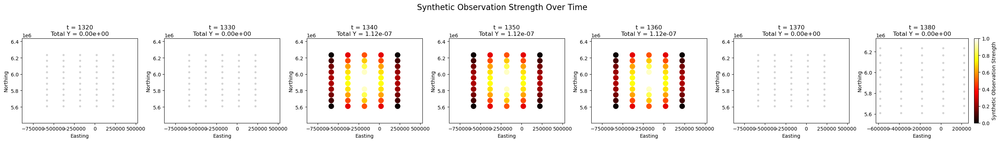

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Use midpoint time for each observation
obsTimes = (obsLocs[:num_obs, 0] + obsLocs[:num_obs, 1]) / 2
xs = obsLocs[:num_obs, 2]
ys = obsLocs[:num_obs, 3]

# Define time bins to visualize
time_bins = np.arange(1320, 1381, 10)# every 30 minutes
n_plots = len(time_bins)

plt.figure(figsize=(4 * n_plots, 4))
for i, t in enumerate(time_bins):
    plt.subplot(1, n_plots, i + 1)
    
    # Filter observations near this time
    keep = np.abs(obsTimes - t) < 15  # ±15 minutes window
    
    plt.scatter(xs, ys, color='lightgrey', s=10, label='All Sensors')
    sc = plt.scatter(xs[keep], ys[keep], c=Y[keep], cmap='hot', s=100)
    
    plt.title(f"t = {t:.0f}\nTotal Y = {np.sum(Y[keep]):.2e}")
    plt.xlabel("Easting")
    plt.ylabel("Northing")
    plt.axis('equal')

plt.colorbar(sc, label='Synthetic Observation Strength')
plt.suptitle("Synthetic Observation Strength Over Time", fontsize=16)
plt.tight_layout()
plt.show()


In [6]:
Hs = list(sensors.getHs(mInfer))
for i, H in enumerate(Hs[:3]):
    print(f"H[{i}] nonzero count:", np.count_nonzero(H))
    print(f"Max value: {np.max(H)}")


H[0] nonzero count: 522600
Max value: 5.649606940602035e-13
H[1] nonzero count: 532650
Max value: 5.543010583232185e-13
H[2] nonzero count: 532650
Max value: 5.543010583232185e-13


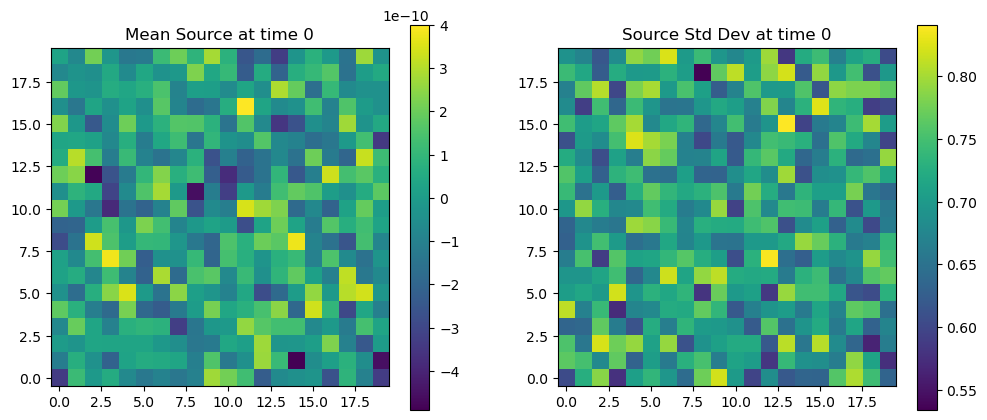

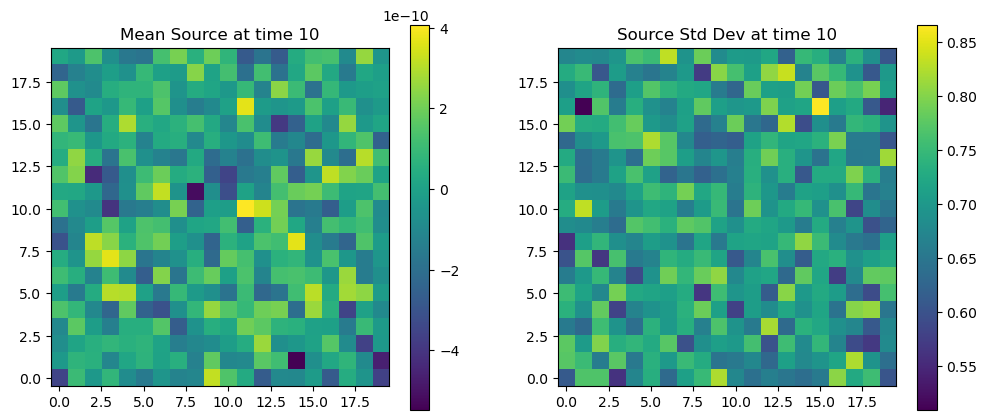

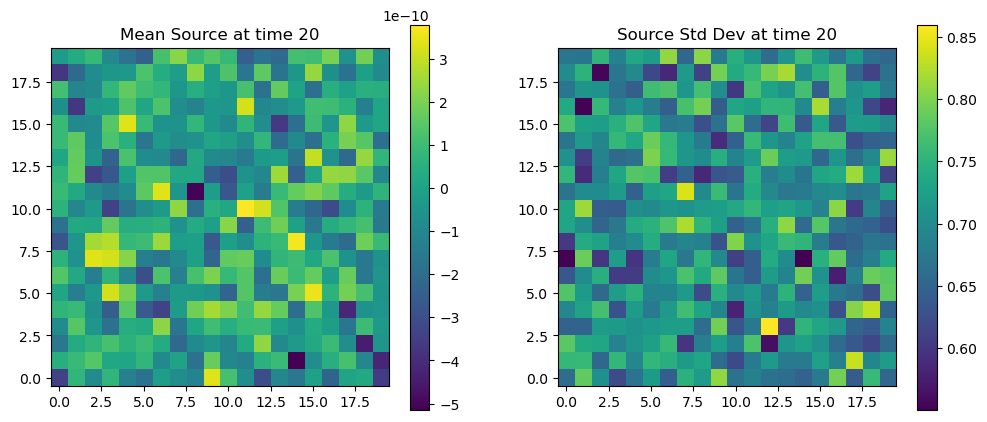

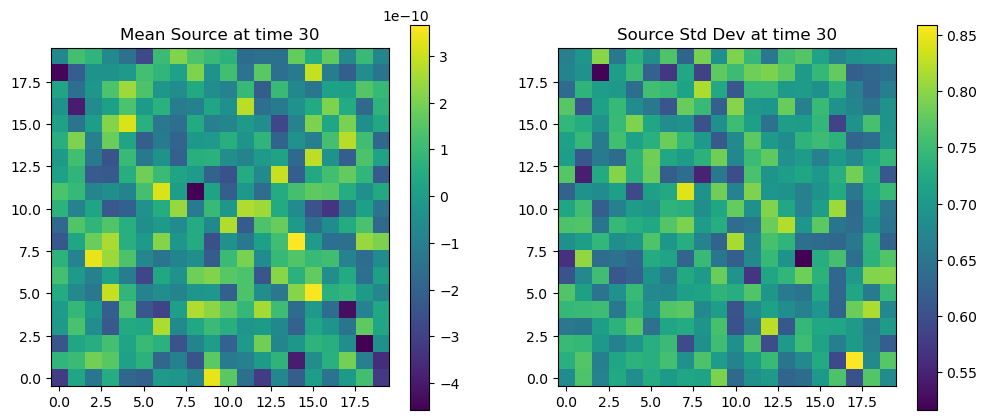

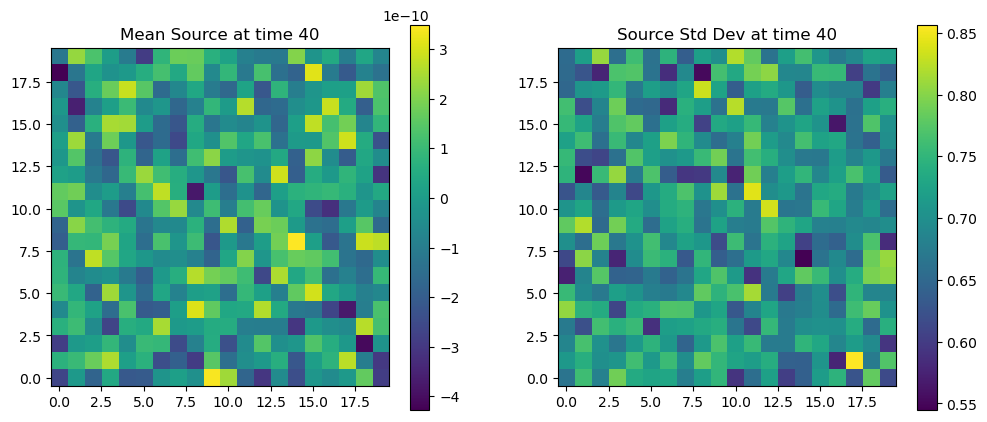

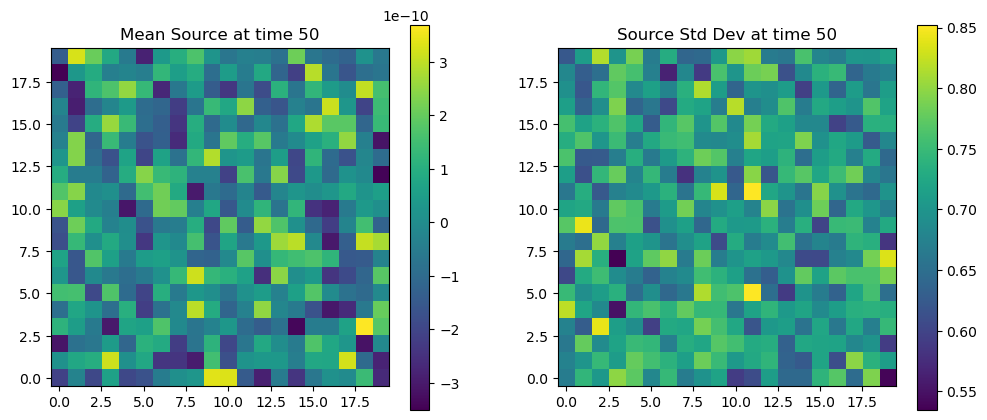

In [12]:
import matplotlib.pyplot as plt

for t_index in range(0, sourcemean.shape[0], 10):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Mean Source at time {t_index}")
    plt.imshow(sourcemean[t_index], origin='lower')
    plt.colorbar()

    plt.subplot(1, 2, 2)
    plt.title(f"Source Std Dev at time {t_index}")
    plt.imshow(np.sqrt(sourcevar[t_index]), origin='lower')
    plt.colorbar()

    plt.show()


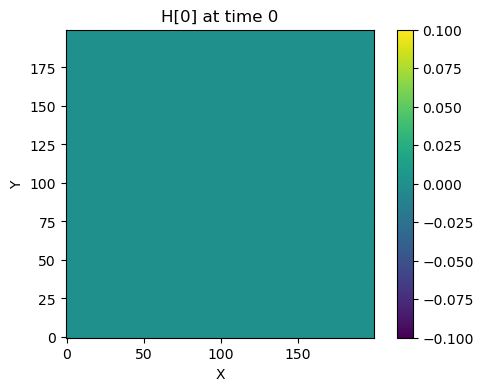

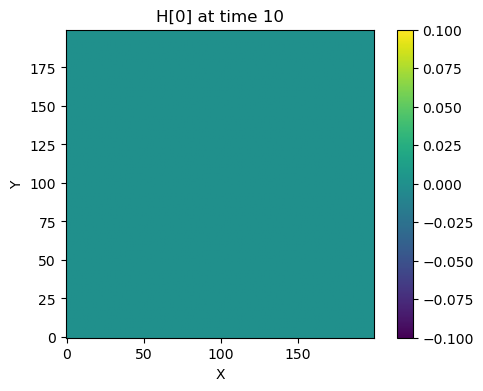

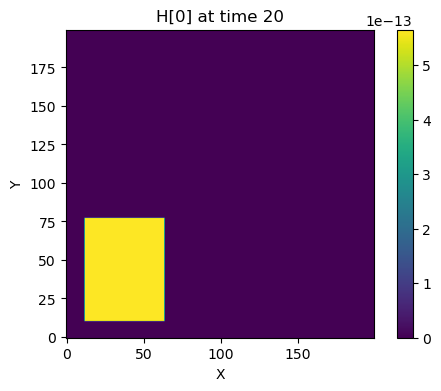

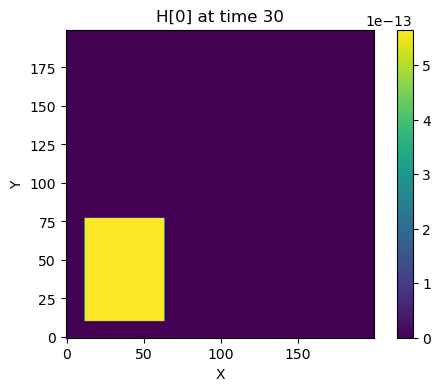

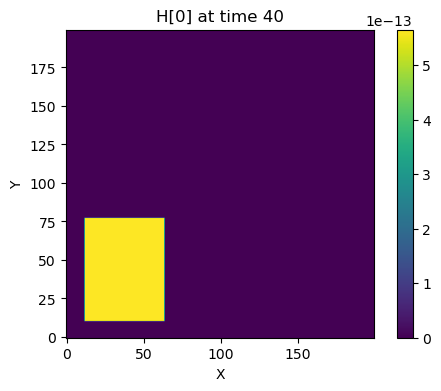

...

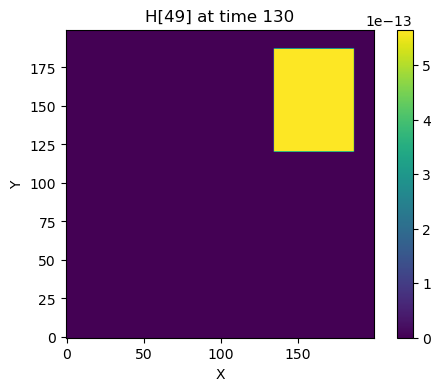

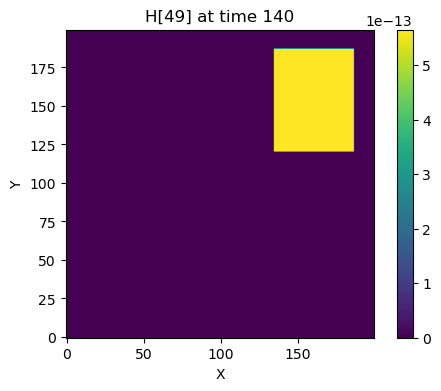

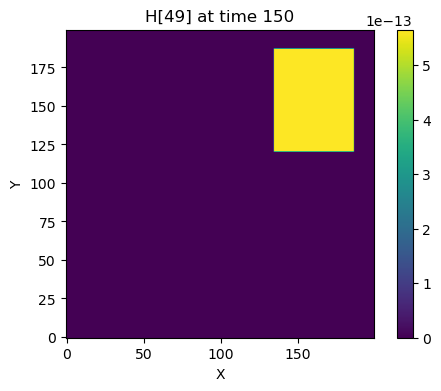

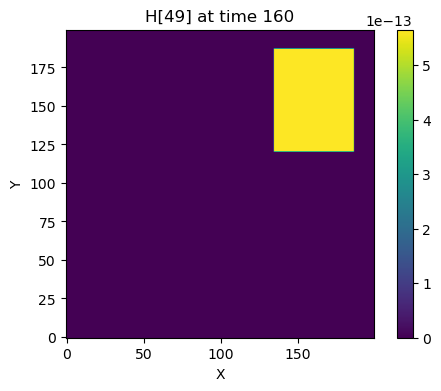

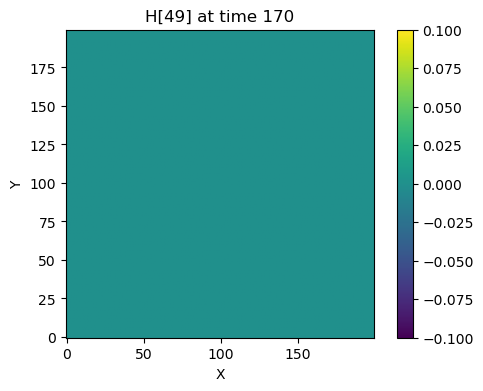

In [16]:
import matplotlib.pyplot as plt
import numpy as np

for i in range(len(Hs)):
    H = Hs[i]
    for t_index in range(0, H.shape[0], 10):  # every 10 timesteps
        plt.figure(figsize=(6, 4))
        plt.imshow(H[t_index], origin='lower')
        plt.title(f"H[{i}] at time {t_index}")
        plt.colorbar()
        plt.xlabel("X")
        plt.ylabel("Y")
        plt.show()


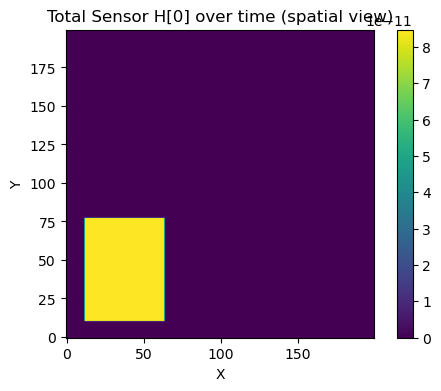

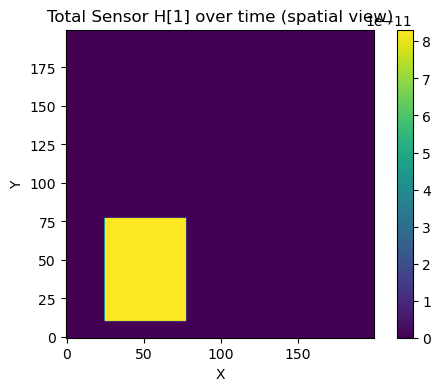

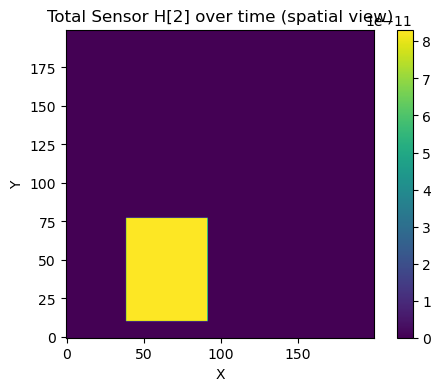

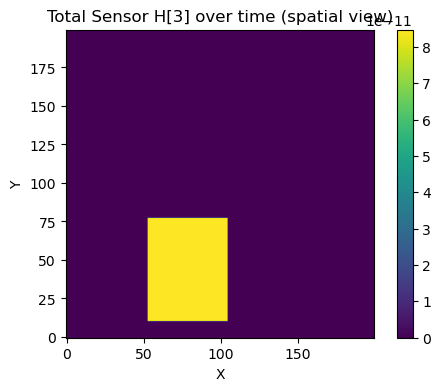

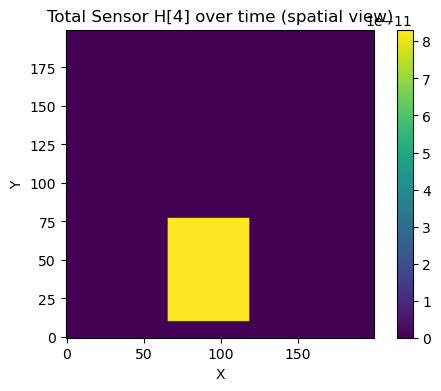

...

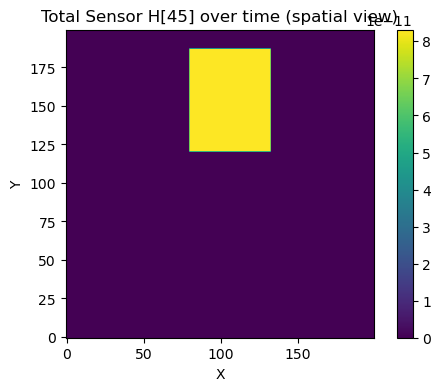

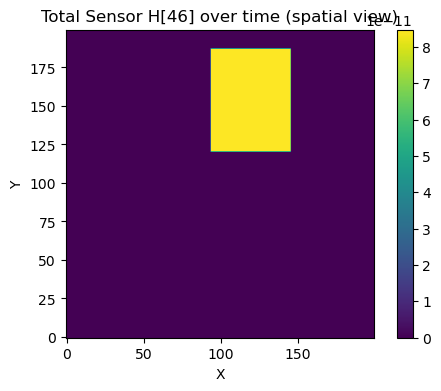

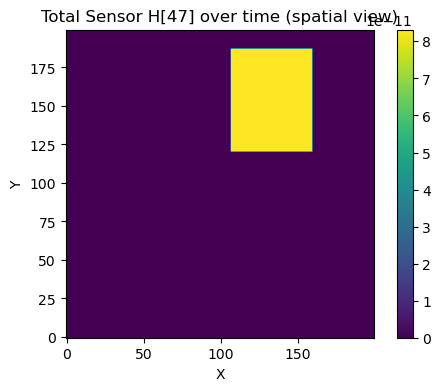

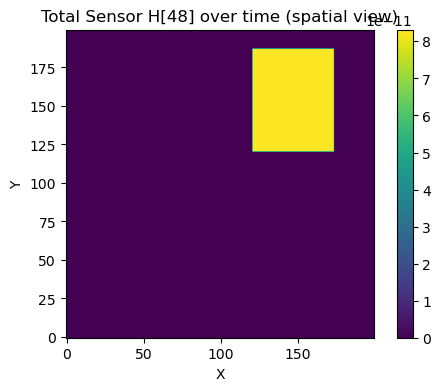

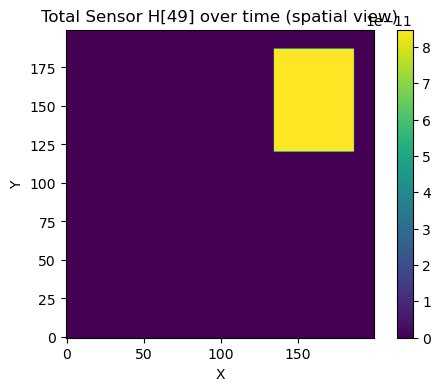

In [17]:
import matplotlib.pyplot as plt

for i in range(len(Hs)):
    H = Hs[i]
    H_sum = np.sum(H, axis=0)  # sum over time
    plt.figure(figsize=(6, 4))
    plt.imshow(H_sum, origin='lower')
    plt.title(f"Total Sensor H[{i}] over time (spatial view)")
    plt.colorbar()
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.show()
